In [1]:
import pandas as pd 
import matplotlib.pyplot as plt 
import seaborn as sns
from wordcloud import WordCloud,STOPWORDS
from textblob import TextBlob
from plotly.offline import iplot
import cufflinks as cf
cf.go_offline()
cf.set_config_file(offline=False, world_readable=True)

In [2]:
reviews = pd.read_json(r'C:\Users\dfota\OneDrive\Έγγραφα\Thesis Project\Amazon-Game-Reviews-Analysis\Data\MergedDataset.json')

In [3]:
def f(row):
    
    '''This function returns sentiment value based on the overall ratings from the user'''
    
    if row['overall'] == 3.0:
        val = 'Neutral'
    elif row['overall'] == 1.0 or row['overall'] == 2.0:
        val = 'Negative'
    elif row['overall'] == 4.0 or row['overall'] == 5.0:
        val = 'Positive'
    else:
        val = -1
    return val

In [4]:
reviews['sentiment'] = reviews.apply(f, axis=1)
reviews.head()

,asin,overall,reviewTime,title,category,imageURLHighRes,reviews,sentiment
0,B00000DMAN,5,"11 28, 1999",The X-Files Game,PC,https://images-na.ssl-images-amazon.com/images...,"This game is a lot of fun, with a creepy atmos...",Positive
1,B00000DMAN,4,"03 5, 2003",The X-Files Game,PC,https://images-na.ssl-images-amazon.com/images...,This was not the best mystery/adventure game I...,Positive
2,B00000DMAN,4,"02 13, 2001",The X-Files Game,PC,https://images-na.ssl-images-amazon.com/images...,"This was a pretty good game, but not a great g...",Positive
3,B00000DMAN,4,"08 19, 2000",The X-Files Game,PC,https://images-na.ssl-images-amazon.com/images...,We stopped watching the series (lack of time) ...,Positive
4,B00000DMAN,5,"07 27, 2000",The X-Files Game,PC,https://images-na.ssl-images-amazon.com/images...,"As a fan of Myst and Riven, I would not put th...",Positive


In [5]:
reviews['sentiment'].value_counts()

Positive    81380
Negative    16061
Neutral     14141
Name: sentiment, dtype: int64

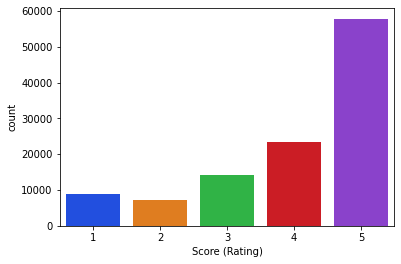

In [6]:
plt.figure()
sns.countplot(x='overall', data=reviews, palette='bright')
plt.xlabel('Score (Rating)')
plt.show()

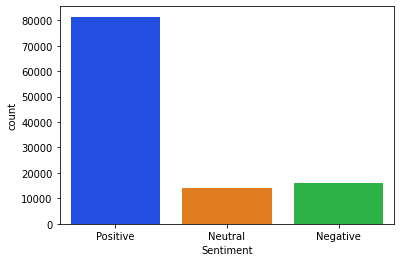

In [7]:
plt.figure()
sns.countplot(x='sentiment', data=reviews, palette='bright')
plt.xlabel('Sentiment')
plt.show()

In [8]:
# new data frame which has date and year
new = reviews["reviewTime"].str.split(",", n = 1, expand = True) 
  
# making separate date column from new data frame 
reviews["date"]= new[0] 
  
# making separate year column from new data frame 
reviews["year"]= new[1] 

reviews=reviews.drop(['reviewTime'], axis=1)
reviews.head()

,asin,overall,title,category,imageURLHighRes,reviews,sentiment,date,year
0,B00000DMAN,5,The X-Files Game,PC,https://images-na.ssl-images-amazon.com/images...,"This game is a lot of fun, with a creepy atmos...",Positive,11 28,1999
1,B00000DMAN,4,The X-Files Game,PC,https://images-na.ssl-images-amazon.com/images...,This was not the best mystery/adventure game I...,Positive,03 5,2003
2,B00000DMAN,4,The X-Files Game,PC,https://images-na.ssl-images-amazon.com/images...,"This was a pretty good game, but not a great g...",Positive,02 13,2001
3,B00000DMAN,4,The X-Files Game,PC,https://images-na.ssl-images-amazon.com/images...,We stopped watching the series (lack of time) ...,Positive,08 19,2000
4,B00000DMAN,5,The X-Files Game,PC,https://images-na.ssl-images-amazon.com/images...,"As a fan of Myst and Riven, I would not put th...",Positive,07 27,2000


In [9]:
new1 = reviews["date"].str.split(" ", n = 1, expand = True) 
  
# adding month to the main dataset 
reviews["month"]= new1[0] 
  
# adding day to the main dataset 
reviews["day"]= new1[1] 

reviews=reviews.drop(['date'], axis=1)
reviews.head()

,asin,overall,title,category,imageURLHighRes,reviews,sentiment,year,month,day
0,B00000DMAN,5,The X-Files Game,PC,https://images-na.ssl-images-amazon.com/images...,"This game is a lot of fun, with a creepy atmos...",Positive,1999,11,28
1,B00000DMAN,4,The X-Files Game,PC,https://images-na.ssl-images-amazon.com/images...,This was not the best mystery/adventure game I...,Positive,2003,03,5
2,B00000DMAN,4,The X-Files Game,PC,https://images-na.ssl-images-amazon.com/images...,"This was a pretty good game, but not a great g...",Positive,2001,02,13
3,B00000DMAN,4,The X-Files Game,PC,https://images-na.ssl-images-amazon.com/images...,We stopped watching the series (lack of time) ...,Positive,2000,08,19
4,B00000DMAN,5,The X-Files Game,PC,https://images-na.ssl-images-amazon.com/images...,"As a fan of Myst and Riven, I would not put th...",Positive,2000,07,27


In [10]:
my_max = reviews['year'].astype(str).astype(int).loc[reviews['year'].astype(str).astype(int).idxmax()]
print(my_max)

2018


In [11]:
my_min = reviews['year'].astype(str).astype(int).loc[reviews['year'].astype(str).astype(int).idxmin()]
print(my_min)

1999


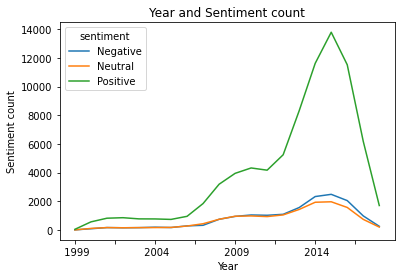

In [12]:
reviews.groupby(['year','sentiment'])['sentiment'].count().unstack().plot(legend=True)
plt.title('Year and Sentiment count')
plt.xlabel('Year')
plt.ylabel('Sentiment count')
plt.show()

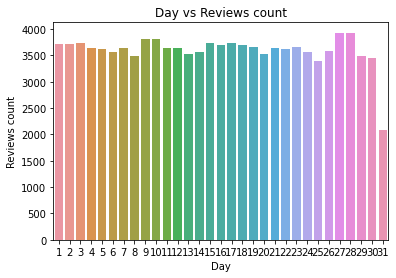

In [13]:
#Creating a dataframe
day=pd.DataFrame(reviews.groupby('day')['reviews'].count()).reset_index()
day['day']=day['day'].astype('int64')
day.sort_values(by=['day'])

#Plotting the graph
sns.barplot(x="day", y="reviews", data=day)
plt.title('Day vs Reviews count')
plt.xlabel('Day')
plt.ylabel('Reviews count')
plt.show()

In [14]:
review_pos = reviews[reviews["sentiment"]=='Positive']
review_neu = reviews[reviews["sentiment"]=='Neutral']
review_neg = reviews[reviews["sentiment"]=='Negative']

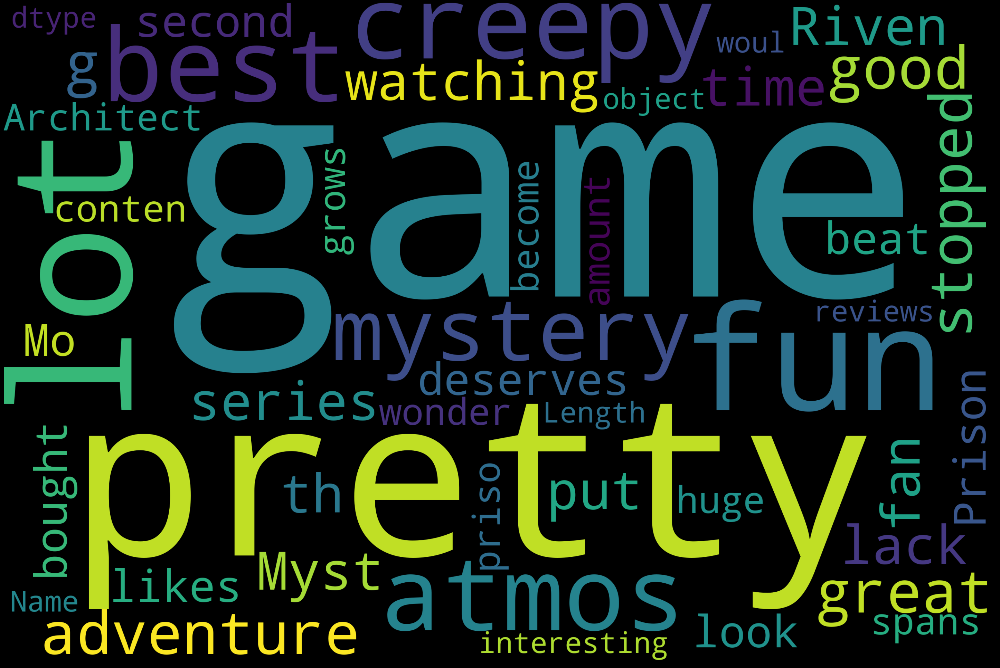

In [15]:
text = review_pos["reviews"]
wordcloud = WordCloud(
    width = 3000,
    height = 2000,
    background_color = 'black',
    stopwords = STOPWORDS).generate(str(text))
fig = plt.figure(
    figsize = (40, 30),
    facecolor = 'k',
    edgecolor = 'k')
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

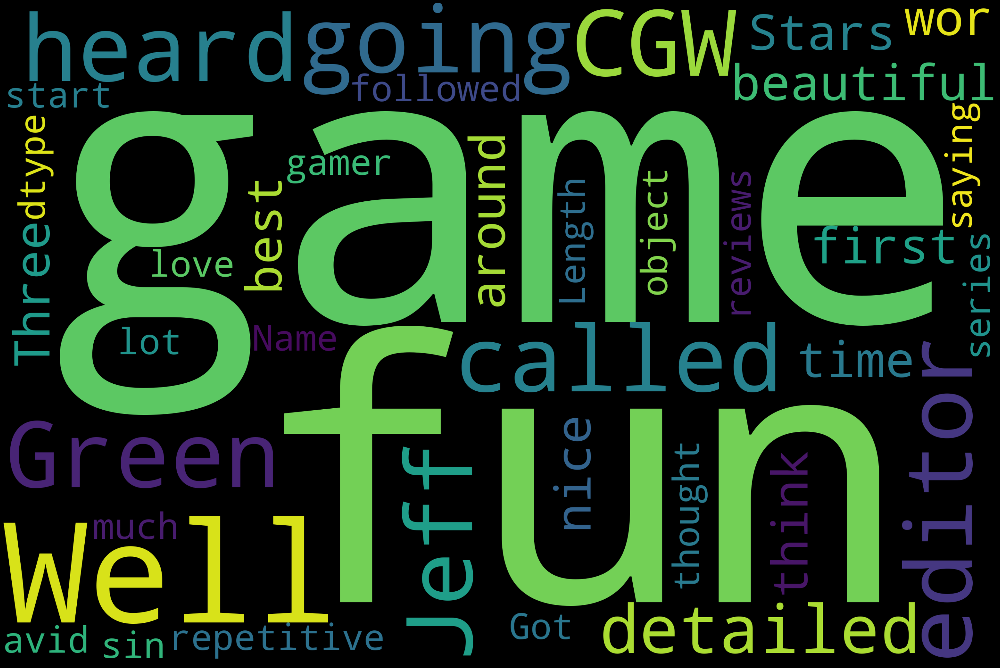

In [16]:
text = review_neu["reviews"]
wordcloud = WordCloud(
    width = 3000,
    height = 2000,
    background_color = 'black',
    stopwords = STOPWORDS).generate(str(text))
fig = plt.figure(
    figsize = (40, 30),
    facecolor = 'k',
    edgecolor = 'k')
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

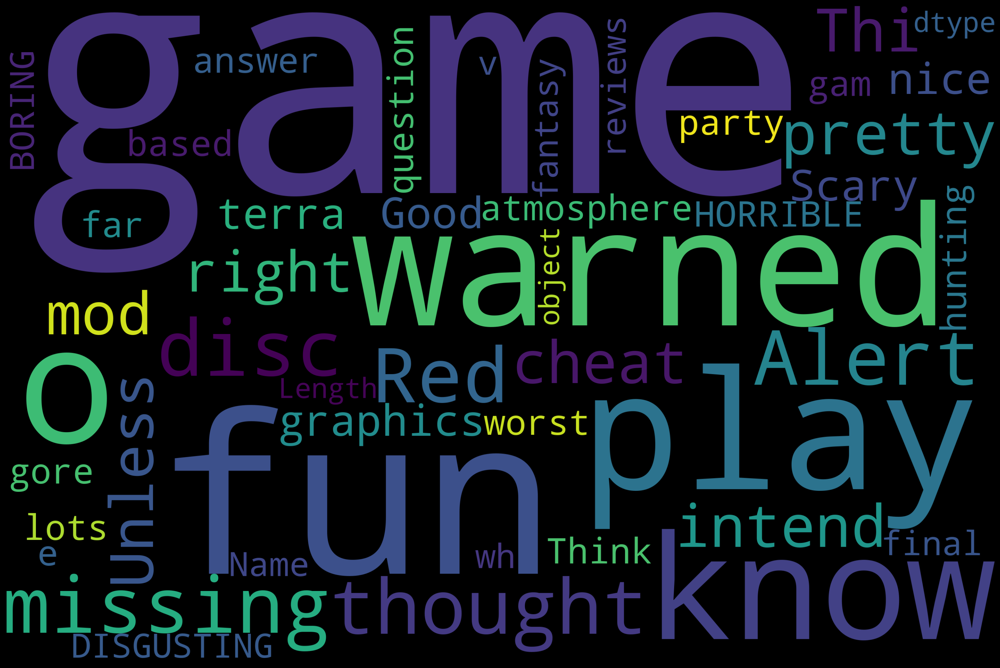

In [17]:
text = review_neg["reviews"]
wordcloud = WordCloud(
    width = 3000,
    height = 2000,
    background_color = 'black',
    stopwords = STOPWORDS).generate(str(text))
fig = plt.figure(
    figsize = (40, 30),
    facecolor = 'k',
    edgecolor = 'k')
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

In [18]:
reviews["review_word_count"] = reviews["reviews"].apply(lambda reviews: len(reviews.split()))

In [19]:
reviews['polarity'] = reviews['reviews'].map(lambda text: TextBlob(text).sentiment.polarity)

In [20]:
reviews['review_len'] = reviews['reviews'].astype(str).apply(len)

In [21]:
reviews.describe()

,overall,review_word_count,polarity,review_len
count,111582.000000,111582.000000,111582.000000,111582.000000
mean,4.024314,166.380940,0.132812,912.570128
std,1.271989,271.353203,0.238873,1516.403975
min,1.000000,1.000000,-1.000000,4.000000
25%,3.000000,24.000000,0.002308,128.000000
50%,5.000000,67.000000,0.106088,355.000000
75%,5.000000,191.000000,0.225000,1033.000000
max,5.000000,5672.000000,1.000000,32670.000000


<AxesSubplot:xlabel='overall', ylabel='polarity'>

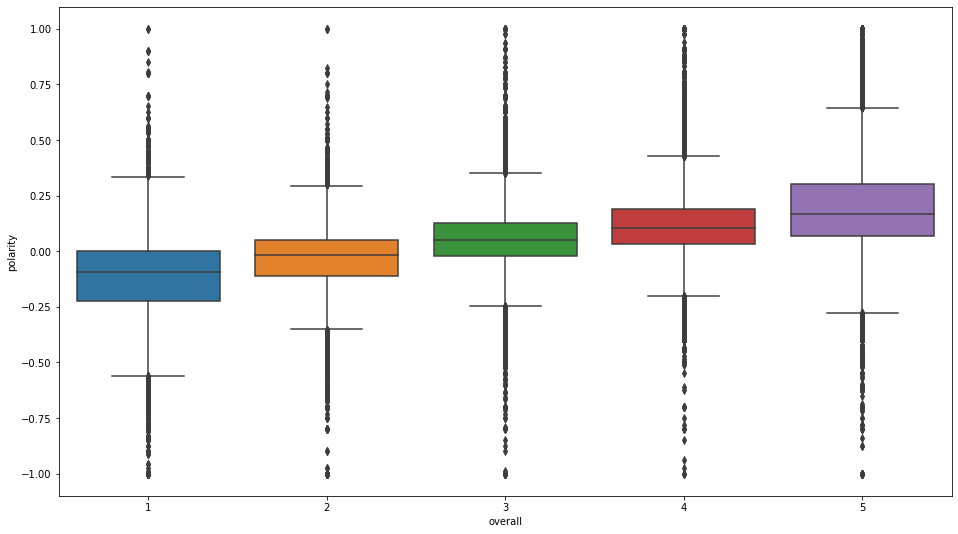

In [22]:
fig, axes = plt.subplots(1, 1, figsize=(16,9))
sns.boxplot( y='polarity', x= 'overall', data=reviews, orient='v')

<AxesSubplot:xlabel='overall', ylabel='polarity'>

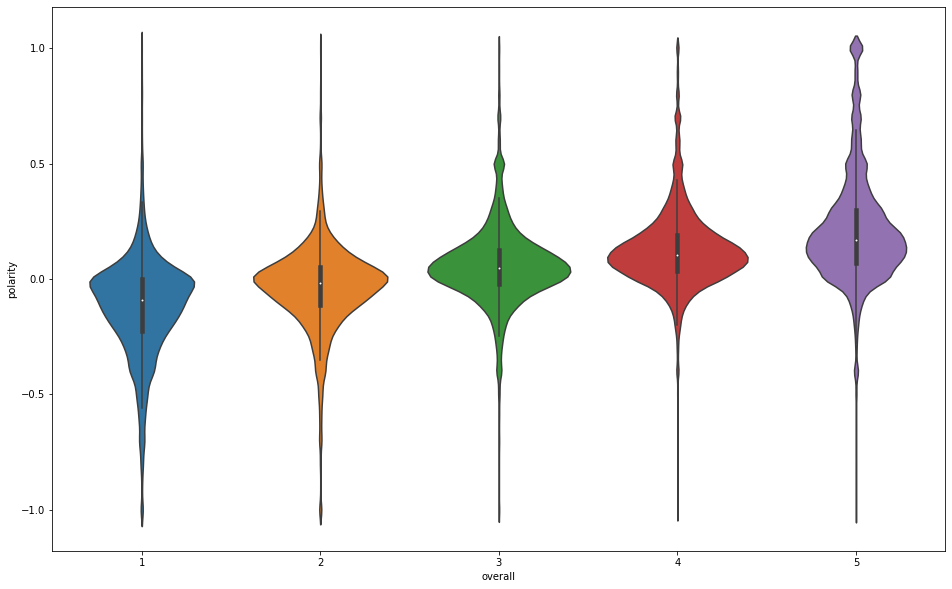

In [23]:
fig, axes = plt.subplots(1, 1, figsize=(16,10))
sns.violinplot( y='polarity', x= 'overall', data=reviews, orient='v')

In [24]:
#!pip install pandas_profiling
#import pandas_profiling
#from pandas_profiling import ProfileReport
#prof = ProfileReport(reviews)
#prof.to_file(output_file='output.html')

In [25]:
reviews['polarity'].iplot(
    kind='hist',
    bins=50,
    xTitle='polarity',
    linecolor='black',
    yTitle='count',
    title='Sentiment Polarity Distribution')

In [26]:
reviews['sentiment'].iplot(
    kind='hist',
    bins=50,
    xTitle='polarity',
    linecolor='black',
    yTitle='count',
    title='Sentiment Polarity Distribution')

In [27]:
reviews.head()

,asin,overall,title,category,imageURLHighRes,reviews,sentiment,year,month,day,review_word_count,polarity,review_len
0,B00000DMAN,5,The X-Files Game,PC,https://images-na.ssl-images-amazon.com/images...,"This game is a lot of fun, with a creepy atmos...",Positive,1999,11,28,115,0.202216,633
1,B00000DMAN,4,The X-Files Game,PC,https://images-na.ssl-images-amazon.com/images...,This was not the best mystery/adventure game I...,Positive,2003,03,5,248,0.042172,1352
2,B00000DMAN,4,The X-Files Game,PC,https://images-na.ssl-images-amazon.com/images...,"This was a pretty good game, but not a great g...",Positive,2001,02,13,185,0.113542,964
3,B00000DMAN,4,The X-Files Game,PC,https://images-na.ssl-images-amazon.com/images...,We stopped watching the series (lack of time) ...,Positive,2000,08,19,283,0.015257,1556
4,B00000DMAN,5,The X-Files Game,PC,https://images-na.ssl-images-amazon.com/images...,"As a fan of Myst and Riven, I would not put th...",Positive,2000,07,27,226,-0.003880,1224


In [28]:
reviews.loc[(reviews['review_word_count']>150) & (reviews['sentiment']=='Positive') & (reviews['category'] == 'PC')]

,asin,overall,title,category,imageURLHighRes,reviews,sentiment,year,month,day,review_word_count,polarity,review_len
1,B00000DMAN,4,The X-Files Game,PC,https://images-na.ssl-images-amazon.com/images...,This was not the best mystery/adventure game I...,Positive,2003,03,5,248,0.042172,1352
2,B00000DMAN,4,The X-Files Game,PC,https://images-na.ssl-images-amazon.com/images...,"This was a pretty good game, but not a great g...",Positive,2001,02,13,185,0.113542,964
3,B00000DMAN,4,The X-Files Game,PC,https://images-na.ssl-images-amazon.com/images...,We stopped watching the series (lack of time) ...,Positive,2000,08,19,283,0.015257,1556
4,B00000DMAN,5,The X-Files Game,PC,https://images-na.ssl-images-amazon.com/images...,"As a fan of Myst and Riven, I would not put th...",Positive,2000,07,27,226,-0.003880,1224
7,B00000DMAM,5,Unreal (Jewel Case) - PC,PC,https://images-na.ssl-images-amazon.com/images...,I was feeling nostalgic last week so I started...,Positive,2008,11,1,1371,0.100099,7523
...,...,...,...,...,...,...,...,...,...,...,...,...,...
30686,B008VUP8VM,5,Brink of Consciousness: Dorian Gray Syndrome C...,PC,https://images-na.ssl-images-amazon.com/images...,"In a nutshell, this is one of the most excitin...",Positive,2012,11,19,164,-0.001993,854
30706,B009KSPF0I,5,Crusader Kings II: Legacy of Rome [Online Game...,PC,https://images-na.ssl-images-amazon.com/images...,Having purchased Crusader Kings 2 as a bundle ...,Positive,2014,09,29,158,-0.075950,911
30735,B00FI377DM,5,SPIRITS OF MYSTERY Hidden Object 2 GAME PACK: ...,PC,None,"I didn't buy this at Amazon, I got it at Wal-M...",Positive,2014,05,6,210,0.060145,1139
30819,B00MCYALXI,5,GRIM TALES: BLOODY MARY Collectors Edition Hid...,PC,None,What a game--took me 4 days to complete. Diffe...,Positive,2016,02,15,229,0.037771,1145
